> ## What do I do now?
* study for mock interview first

* re-watch lectures to understand nlp / svd / pca more

* Run cleaning on entire data set, export to CSV so it can be uploaded to git (currently above 50MB limit)
* Run PCA and Reconstruction error and see if it is still k=3 optimal
* Find out how to classify these latent topics and how to read
* How to put everything to positive?

    
* investigate more domain knowledge
* preprocess text more
* plot using ron's notes

In [228]:
import psycopg2 as pg2
import pandas as pd
import pprint 
import string
import unicodedata
import numpy as np

from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn import decomposition

import matplotlib.pyplot as plt
from pandas.plotting import scatter_matrix

import nltk
from nltk.tokenize import sent_tokenize
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from nltk.stem.snowball import SnowballStemmer
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.util import ngrams
from nltk import pos_tag
from nltk import RegexpParser
import re

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans

In [17]:
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /home/zy/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.


True

In [426]:
def cleandata(df):
    numdf = df.copy()
    wordsdf = df[['game.id','details.name','details.description','attributes.boardgamecategory','attributes.boardgamemechanic']]
    
    filters_ = ['stats.family*','stats.subtype*', 'attributes.t*','polls.*']
    col_to_drop = ['Unnamed: 0','row_names','details.image','details.thumbnail', 'details.name','details.description', 'game.type', 'stats.median', 'stats.numweights']
    
    for filter_ in filters_:
        numdf.drop(list(numdf.filter(regex = filter_)), axis = 1, inplace=True
                       )
    numdf.drop(col_to_drop, axis=1, inplace=True)
    
    return wordsdf, numdf
    

In [425]:
bgdf = pd.read_csv('data/boardgames.csv', index_col=False, low_memory=False)

In [427]:
worddata, numdata = cleandata(bgdf)

In [51]:
worddata.to_csv('data/word_data_cleaned.csv')

### Numbers Data
#### Definitions for:

* stats.average : min 0.0, max 10.0, looks like an avg rating
* stats.averageweight : How heavy (difficult/complex) is this game?
* stats.bayesaverage : min 0.0, max 8.48. unsure
* stats.median : zeros, drop
* stats.numweights : min 0.0, mean 10.3, max 6448, median 0.0. Unable to find desc on data info. drop
* stats.stddev

In [470]:
numdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90400 entries, 0 to 90399
Data columns (total 18 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   game.id                90400 non-null  int64  
 1   details.maxplayers     90397 non-null  float64
 2   details.maxplaytime    90397 non-null  float64
 3   details.minage         90397 non-null  float64
 4   details.minplayers     90397 non-null  float64
 5   details.minplaytime    90397 non-null  float64
 6   details.playingtime    90397 non-null  float64
 7   details.yearpublished  90397 non-null  float64
 8   stats.average          90400 non-null  float64
 9   stats.averageweight    90400 non-null  float64
 10  stats.bayesaverage     90400 non-null  float64
 11  stats.numcomments      90400 non-null  float64
 12  stats.owned            90400 non-null  float64
 13  stats.stddev           90400 non-null  float64
 14  stats.trading          90400 non-null  float64
 15  st

In [47]:
numdata['stats.numweights'].describe()

count    90400.000000
mean        10.256338
std         86.402086
min          0.000000
25%          0.000000
50%          0.000000
75%          2.000000
max       6448.000000
Name: stats.numweights, dtype: float64

In [46]:
numdata['stats.stddev'].describe()

count    90400.000000
mean         0.945540
std          0.989744
min          0.000000
25%          0.000000
50%          0.986687
75%          1.535955
max          4.500000
Name: stats.stddev, dtype: float64

1. apply PCA to numeric only data and find out how many PCA components you need to capture 90% of variation
    * transformed into latent features 
    * throw away the remaining latent features 

2. apply kmeans clustering, look for clusters either with elbow or sihoulitte 
    * pick number of clusters (more meaningful)

3. make sense of clusters with names of games

4. with text data, do svd/pca/nmf

5. find how many latent features you need to capture 90% of variation in data

6. apply clustering and make sense of clusters / games

sparse matrices

### Word Data

In [417]:
worddata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90400 entries, 0 to 90399
Data columns (total 5 columns):
 #   Column                        Non-Null Count  Dtype 
---  ------                        --------------  ----- 
 0   game.id                       90400 non-null  int64 
 1   details.name                  90400 non-null  object
 2   details.description           90373 non-null  object
 3   attributes.boardgamecategory  88869 non-null  object
 4   attributes.boardgamemechanic  75163 non-null  object
dtypes: int64(1), object(4)
memory usage: 3.4+ MB


In [435]:
worddatana['attributes.boardgamecategory']

0                           Economic,Negotiation,Political
1                                        Card Game,Fantasy
2                               Abstract Strategy,Medieval
3                                                  Ancient
4                            Card Game,Farming,Negotiation
                               ...                        
90394               Adventure,Exploration,Video Game Theme
90396    Bluffing,Card Game,Negotiation,Religious,Renai...
90397    Ancient,Card Game,Dice,Expansion for Base-game...
90398    Ancient,Card Game,Dice,Expansion for Base-game...
90399       Bluffing,Card Game,Deduction,Horror,Party Game
Name: attributes.boardgamecategory, Length: 74264, dtype: object

In [436]:
#tokenize all boardgame categories
# nltk.word_tokenize(worddata['attributes.boardgamecategory'].str.split())

# worddata['attributes.boardgamecategory'].str.split(',|/')
# [x.strip() for x in worddata['attributes.boardgamecategory'].str.split(',|/')]

categories_ = worddatana[['attributes.boardgamecategory']].apply(lambda x : x.str.split(',| / '))


# .apply(lambda x : i.strip() for i in x)
# cat_list = categories.iloc[:,0].to_list()

# flattened_cat = []
# for row in cat_list:
#     try:
#         for item in row:
#             flattened_cat.append(item.strip())
#     except(TypeError):
#         pass
# set(flattened_cat)

In [437]:
worddatana['category'] = categories_.iloc[:,0]
worddatana.head()

/home/zy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,game.id,details.name,details.description,attributes.boardgamecategory,attributes.boardgamemechanic,category
0,1,Die Macher,Die Macher is a game about seven sequential po...,"Economic,Negotiation,Political","Area Control / Area Influence,Auction/Bidding,...","[Economic, Negotiation, Political]"
1,2,Dragonmaster,Dragonmaster is a trick-taking card game based...,"Card Game,Fantasy",Trick-taking,"[Card Game, Fantasy]"
2,3,Samurai,"Part of the Knizia tile-laying trilogy, Samura...","Abstract Strategy,Medieval","Area Control / Area Influence,Hand Management,...","[Abstract Strategy, Medieval]"
3,4,Tal der Könige,When you see the triangular box and the luxuri...,Ancient,"Action Point Allowance System,Area Control / A...",[Ancient]
4,11,Bohnanza,Bohnanza is the first in the Bohnanza family o...,"Card Game,Farming,Negotiation","Hand Management,Set Collection,Trading","[Card Game, Farming, Negotiation]"


In [423]:
# categories_['attributes.boardgamecategory'].apply(lambda x: func_(x))

count =0
for i in categories_['attributes.boardgamecategory'].values:
    if type(i) == float:
        count += 1
print(count)

1531


In [296]:
worddata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90400 entries, 0 to 90399
Data columns (total 5 columns):
 #   Column                        Non-Null Count  Dtype 
---  ------                        --------------  ----- 
 0   game.id                       90400 non-null  int64 
 1   details.name                  90400 non-null  object
 2   details.description           90373 non-null  object
 3   attributes.boardgamecategory  88869 non-null  object
 4   attributes.boardgamemechanic  75163 non-null  object
dtypes: int64(1), object(4)
memory usage: 3.4+ MB


In [434]:
worddatana = worddata.dropna(axis=0)

In [439]:
categories = get_unique(worddatana['attributes.boardgamecategory'])
categories

AttributeError: 'str' object has no attribute 'str'

In [421]:
def get_unique(df):
    df_ = df.apply(lambda x : x.str.split(',| / '))
#     print(df_[:,0])
    list_ = df_.iloc[:,0].to_list()
    flattened_list = []
    for row in list_:
        try:
            for item in row:
                flattened_list.append(item.strip())
        except(TypeError):
            pass
    return set(flattened_list)

def clean_worddata(df):
    df_clean = df.dropna(axis=0)
    
    categories_ = df_clean[['attributes.boardgamecategory']].apply(lambda x : x.str.split(',| / '))
    df_clean['category'] = categories_.iloc[:,0]
    del df_clean['attributes.boardgamecategory']
    
    mechanic_ = df_clean[['attributes.boardgamemechanic']].apply(lambda x : x.str.split(',| / '))
    df_clean['mechanic'] = mechanic_.iloc[:,0]
    del df_clean['attributes.boardgamemechanic']
    
    return df_clean

In [412]:
worddata_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 74264 entries, 0 to 90399
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   game.id      74264 non-null  int64 
 1   name         74264 non-null  object
 2   description  74264 non-null  object
 3   category     74264 non-null  object
 4   mechanic     74264 non-null  object
dtypes: int64(1), object(4)
memory usage: 3.4+ MB


In [440]:
worddata_clean = clean_worddata(worddata)
worddata_clean.columns = ['game.id','name','description','category','mechanic']
worddata_clean.to_csv('data/worddata_clean.csv')
worddata_clean.head(20)

/home/zy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/zy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,game.id,name,description,category,mechanic
0,1,Die Macher,Die Macher is a game about seven sequential po...,"[Economic, Negotiation, Political]","[Area Control, Area Influence, Auction/Bidding..."
1,2,Dragonmaster,Dragonmaster is a trick-taking card game based...,"[Card Game, Fantasy]",[Trick-taking]
2,3,Samurai,"Part of the Knizia tile-laying trilogy, Samura...","[Abstract Strategy, Medieval]","[Area Control, Area Influence, Hand Management..."
3,4,Tal der Könige,When you see the triangular box and the luxuri...,[Ancient],"[Action Point Allowance System, Area Control, ..."
4,11,Bohnanza,Bohnanza is the first in the Bohnanza family o...,"[Card Game, Farming, Negotiation]","[Hand Management, Set Collection, Trading]"
5,5,Acquire,"In Acquire, each player strategically invests ...",[Economic],"[Hand Management, Stock Holding, Tile Placement]"
6,6,Mare Mediterraneum,"In the ancient lands along the Mediterranean, ...","[Civilization, Nautical]",[Dice Rolling]
7,7,Cathedral,"In Cathedral, each player has a set of pieces ...",[Abstract Strategy],"[Area Enclosure, Pattern Building, Pattern Rec..."
8,8,Lords of Creation,"In this interesting offering from Warfrog, pla...","[Civilization, Fantasy]",[Modular Board]
9,9,El Caballero,"Although referred to as a sequel to El Grande,...",[Exploration],"[Area Control, Area Influence, Tile Placement]"


In [476]:
worddata_clean['category'][1]

['Card Game', 'Fantasy']

In [477]:
categorydf = pd.DataFrame()
for cat in CATEGORIES:
    categorydf[cat] = worddata_clean['category'].apply(lambda x: True if cat in x else False)


In [478]:
categorydf

,City Building,American West,Mythology,Print & Play,Manufacturing,American Civil War,Renaissance,Maze,Economic,World War I,...,Napoleonic,Real-time,Dexterity,Electronic,Sports,Dice,Word Game,Math,Arabian,Adult
0,False,False,False,False,False,False,False,False,True,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90394,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
90396,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
90397,False,False,True,False,False,False,False,False,False,False,...,False,False,False,False,False,True,False,False,False,False
90398,False,False,True,False,False,False,False,False,False,False,...,False,False,False,False,False,True,False,False,False,False


In [447]:
CATEGORIES = []
for i in worddata_clean['category']:
    for cat_ in i:
        CATEGORIES.append(cat_)
CATEGORIES = set(CATEGORIES)
pd.DataFrame(CATEGORIES).to_csv('data/categories.csv')

In [502]:
CATEGORIES = list(CATEGORIES)

In [530]:
# preprocess dataframe with extract_bow_from_raw_text

worddata_clean['tokens'] = worddata_clean['description'].apply(lambda x: extract_bow_from_raw_text(x))

/home/zy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


/home/zy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


top features (words) for each cluster:
0, build, piec, mole, robot, squar, fossil, chess, territori, move, big, edit, natur, oppon, plot, duchi, town, cathedr, wacki, number


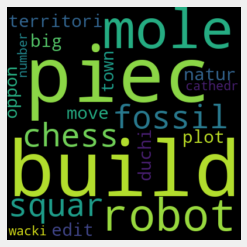

1, knizia, reiner, object, hex, currenc, order, ingredi, arkham, horror, highest, luxuri, senat, table, ziggurat, happi, station, pizza, pawn, publish


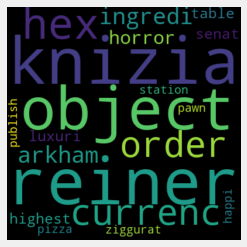

2, stock, airlin, column, compani, abstract, sid, share, sackson, creat, busi, placement, volatil, combin, disk, natur, acquir, differ, dividend, major


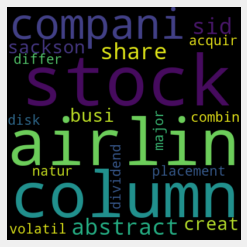

3, block, unit, war, strength, detail, columbia, map, side, step, way, system, good, current, counter, layer, type, eurofront, track, use


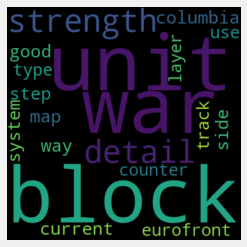

4, civil, war, charact, power, round, unit, play, conquest, titan, word, faction, wargam, advanc, samurai, time, battl, shogun, ship, color


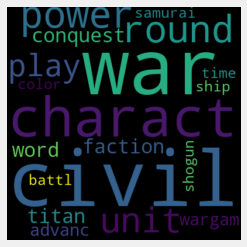

5, edit, bean, bohnanza, first, thing, illuminati, circuit, garden, set, descript, borderland, catan, twilight, trade, pitchcar, imperium, german, chess, expans


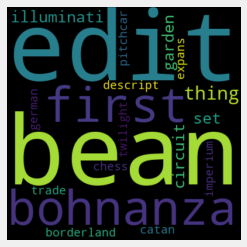

6, action, car, movement, deal, politician, planet, prize, knight, custom, castl, robot, metal, agent, cube, race, aroma, wall, money, full


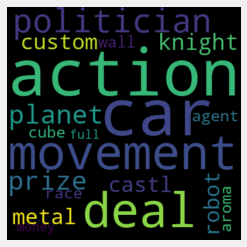

7, rail, money, empir, commod, train, port, railroad, feder, fantasi, demand, chocol, citi, crayon, hellrail, fleet, compani, map, circl, oper


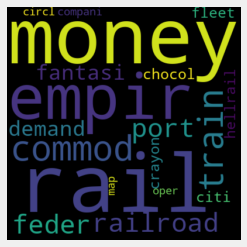

8, land, region, entdeck, brain, parti, island, kontor, caballero, area, resourc, empir, role, food, payout, elect, event, epoch, work, success


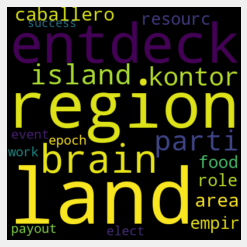

9, transport, magic, treasur, templ, elfenland, match, perfect, explor, monster, mani, charact, tikal, cloud, citi, weapon, room, nuclear, king, elfengold


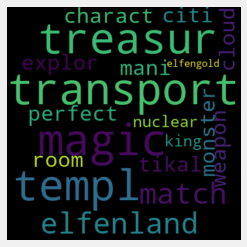

10, expedit, cod, total, number, wildlif, adventur, color, effort, exampl, line, schatzsuch, onto, child, bingo, highest, score, famous, easi, bonus


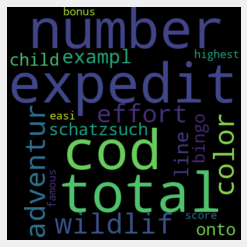

11, oil, vineyard, site, market, drill, grape, gasolin, yield, compani, weinberg, manipul, energi, crude, bid, da, itali, hippodic, spieleautorenwettbewerb, sell


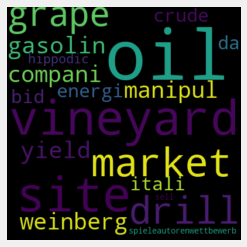

12, citi, build, auction, paint, tower, properti, capit, bid, groo, shop, diseas, princess, set, district, space, round, marin, settler, counter


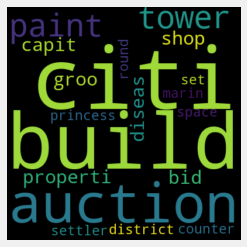

13, dice, dealer, trick, hedgehog, row, goal, towel, tribe, indian, amoeba, way, task, nimmt, take, point, extra, red, last, draft


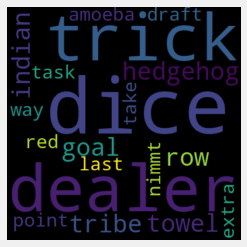

14, trick, suit, tak, hors, unusu, pepper, reward, bunni, winner, uuml, pyramid, genr, lowest, carrot, fox, score, trump, end, suspect


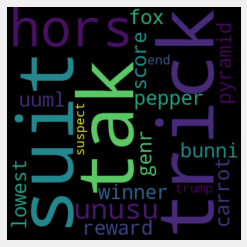

In [529]:
#testing to see quot is removed
testdata = worddata_clean[0:200]
testdata['tokens'] = testdata['description'].apply(lambda x: extract_bow_from_raw_text(x))
vectorizer = TfidfVectorizer(stop_words=sw)
X_test = vectorizer.fit_transform(testdata['tokens'])
kmeanstest = KMeans(15)
kmeanstest.fit(X_test)
print_features(vectorizer, kmeanstest)

In [531]:
X_full = vectorizer.fit_transform(worddata_clean['tokens'])

top features (words) for each cluster:
0, zombi, survivor, human, dead, hord, apocalyps, surviv, new, undead, brain, charact, weapon, item, dice, town, expans, play, citi, rsquo


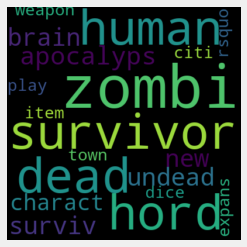

1, unit, german, counter, map, scenario, battl, combat, war, armi, forc, tank, campaign, hex, system, scale, oper, infantri, soviet, command


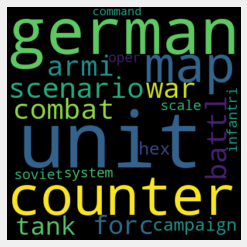

2, new, expans, pack, set, base, addit, map, power, scenario, edit, hero, special, expand, origin, amp, world, mini, charact, wonder


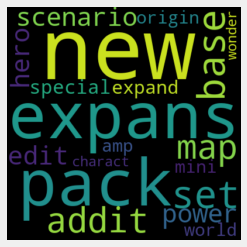

3, dice, roll, number, die, score, chip, round, play, combin, first, color, time, differ, luck, side, result, oppon, set, special


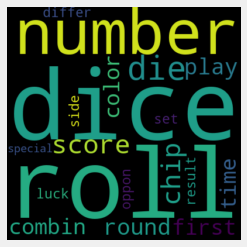

4, first, play, time, differ, action, end, box, set, oppon, rsquo, new, way, object, child, dice, winner, number, world, token


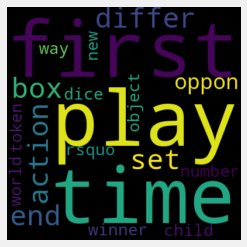

5, space, move, roll, first, die, number, instruct, object, track, simpl, meepl, spinner, mark, dice, amp, color, piec, red, token


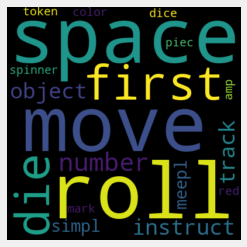

6, car, race, hors, track, finish, dice, driver, line, first, roll, speed, number, lap, space, movement, bet, road, differ, simpl


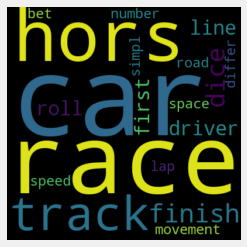

7, question, answer, trivia, categori, correct, trivial, chip, pursuit, quiz, first, die, histori, knowledg, amp, sport, winner, color, space, roll


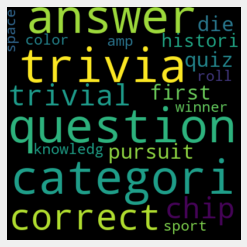

8, anim, zoo, farm, child, first, differ, food, color, dice, die, lion, winner, memori, pictur, match, set, number, end, play


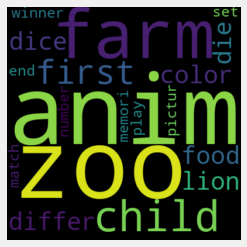

9, color, number, trick, round, suit, stone, score, pile, row, play, first, chip, face, valu, set, tabl, end, differ, highest


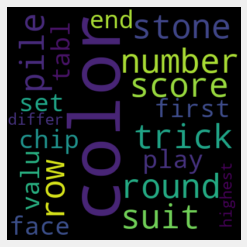

10, word, letter, crossword, score, scrabbl, first, dice, round, number, time, play, team, categori, alphabet, timer, grid, winner, fun, new


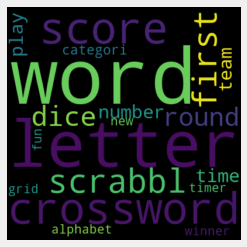

11, charact, hero, dragon, adventur, power, new, abil, play, quest, action, differ, attack, world, set, special, battl, villain, stori, uniqu


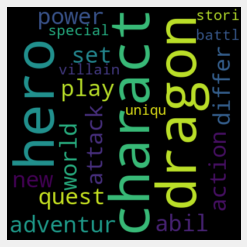

12, ship, pirat, fleet, treasur, captain, crew, sea, star, battl, island, space, combat, action, naval, new, war, system, sail, port


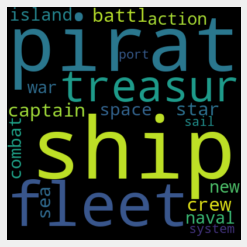

13, properti, monopoli, nu, rent, oppon, bankruptcy, polein, commodity, mono, sigmaf, supplier, lambda, omicron, epsilon, mu, pi, enterpris, hotel, drive


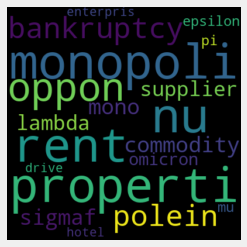

14, piec, chess, squar, oppon, color, space, move, row, side, play, line, captur, number, first, puzzl, king, object, checker, differ


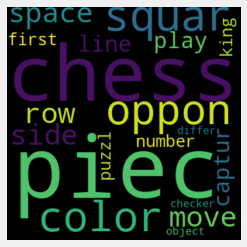

15, pawn, space, move, dice, color, oppon, first, number, field, die, squar, roll, piec, goal, winner, chess, movement, start, side


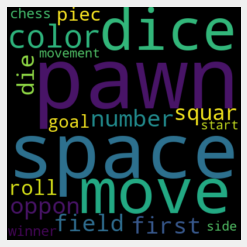

16, war, battl, armi, forc, system, world, combat, scenario, miniatur, campaign, unit, counter, map, tactic, command, civil, new, empir, seri


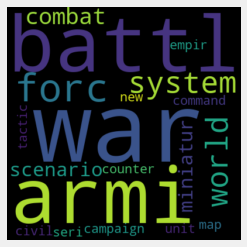

17, citi, compani, stock, build, money, share, monopoli, market, busi, properti, resourc, map, new, end, price, differ, round, railroad, good


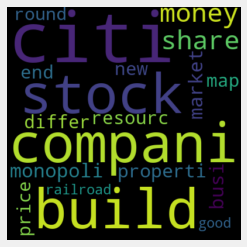

18, team, ball, footbal, play, soccer, basebal, goal, dice, time, field, word, action, match, defens, coach, round, first, leagu, season


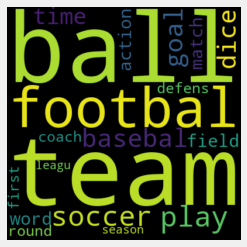

19, monster, dungeon, hero, treasur, adventur, new, room, bos, dragon, trap, dice, power, charact, item, quest, play, munchkin, abil, spell


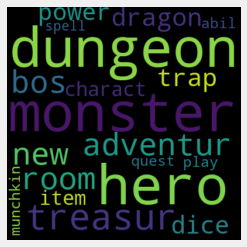

In [535]:
maxk = 20
wcss = np.zeros(maxk)
kmeans = KMeans(maxk)
kmeans.fit(X_full)
print_features(vectorizer, kmeans)

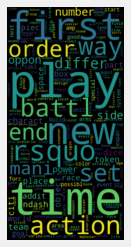

In [542]:
text = worddata_clean['tokens'].to_list()
text = (" ").join(text)

allfeaturesWC = WordCloud(width = 300, height = 600).generate(text)
allfeaturesWC.to_file("img/fullwordcloud.png")
plt.imshow(allfeaturesWC, interpolation='bilinear')
plt.axis("off")
plt.show();

In [536]:
print("number of features: ",len(vectorizer.get_feature_names()))

number of features:  97565


In [466]:
from sklearn.metrics import silhouette_score

In [469]:
# A list holds the silhouette coefficients for each k
silhouette_coefficients = []

# Notice you start at 2 clusters for silhouette coefficient
for k in range(2, 18):
    kmeanssc = KMeans(n_clusters=k)
    kmeanssc.fit(X_full)
    score = silhouette_score(X_full, kmeanssc.labels_)
    silhouette_coefficients.append(score)


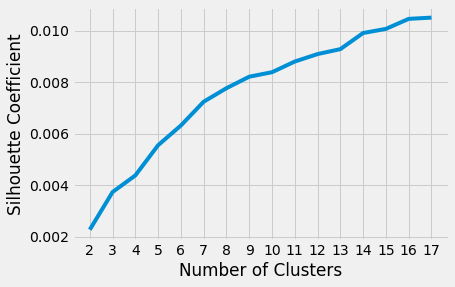

<Figure size 432x288 with 0 Axes>

In [473]:
plt.style.use("fivethirtyeight")
plt.plot(range(2, 18), silhouette_coefficients)
plt.xticks(range(2, 18))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Coefficient")
plt.show()
plt.savefig('img/silhouette.png')

In [516]:
cityBuildingTokens = worddata_clean['tokens'][(categorydf['City Building'])].to_list()
cityBuildingTokens = (" ").join(cityBuildingTokens)
cityBuildingTokens

"translat natur wilder central park peripheri hous such way man natur harmoni build crowd game. long time villag disturb townsfolk entir town order evil menac dog-mous idiomat thing villag build town precious outhous citi wall river road thing build outhous outhous vote particular section most type build piec winner person highest valu build wacki wacki west re-mak descript fan klaus teuber interest remake/redesign drunter und dr uuml ber spiel jahr winner. just south junction mayfair amp rossdorf rr turvi trunk line desert tumblewe eccentr littl town rossdorf most western town rossdorf land agent guy dough brother varmint black benni shrewd opportunist guy town land outhous time acr town outhous miner railroad fort captain year miner shadow fort rossdorf mother lode gold friend littl spring ordinari spring torrent mind-marbl local wacki water quot water sun wind landhold enough matter own mean competit lay claim onli fertil spot town onli thing stoppin town charter amend quot landhold

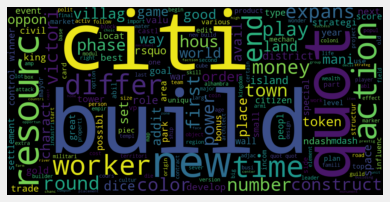

In [496]:

wordcloud = WordCloud(width=1000, height=500).generate(cityBuildingTokens)
wordcloud.to_file(f"img/citybuilding.png")
# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

City Building:


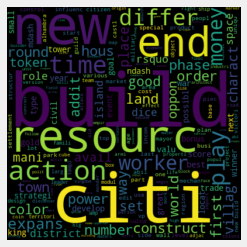

American West:


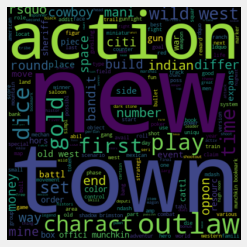

Mythology:


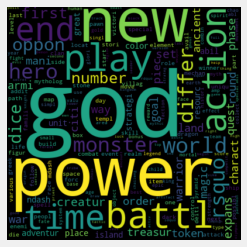

Print & Play:


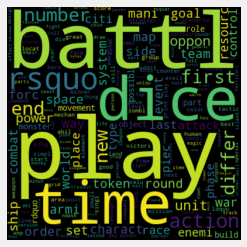

Manufacturing:


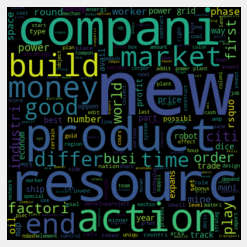

American Civil War:


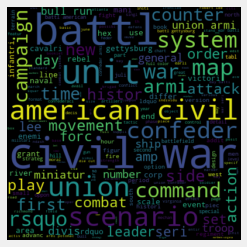

Renaissance:


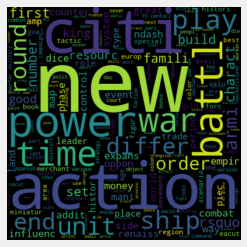

Maze:


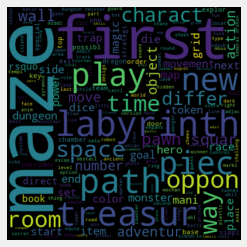

Economic:


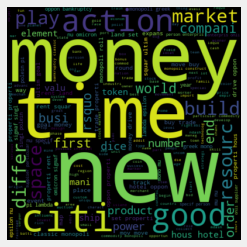

World War I:


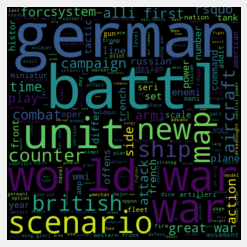

Animals:


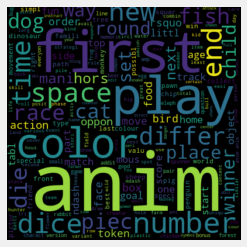

TV:


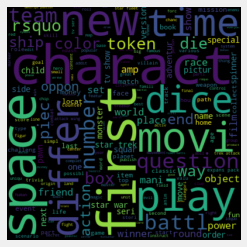

Action:


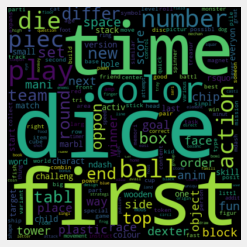

Card Game:


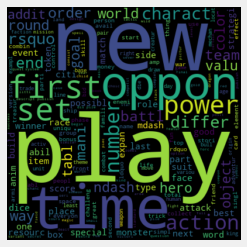

Age of Reason:


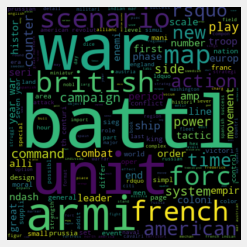

Murder/Mystery:


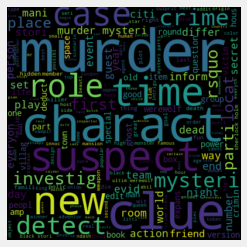

Aviation:


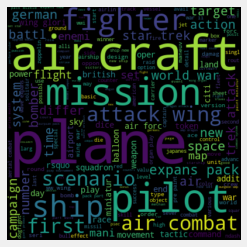

Humor:


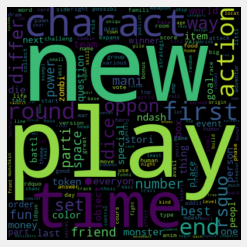

Environmental:


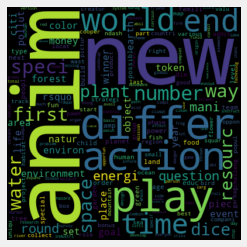

Farming:


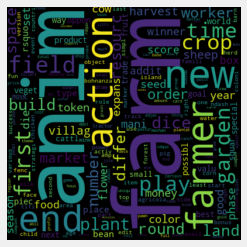

Deduction:


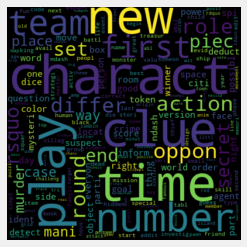

Trains:


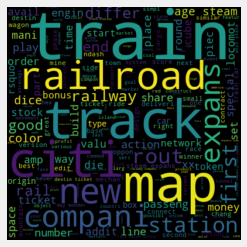

Civilization:


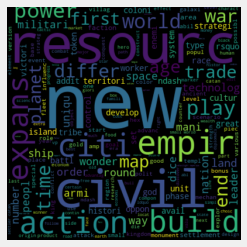

Nautical:


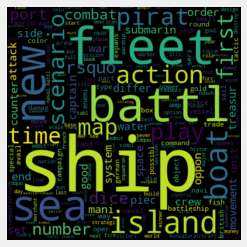

Prehistoric:


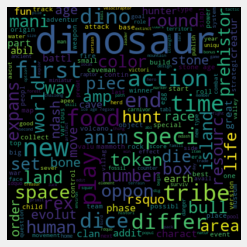

Zombies:


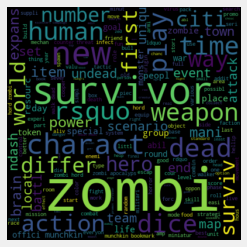

Flight:


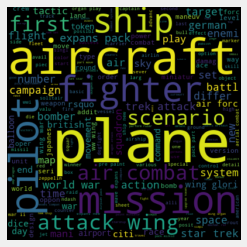

Medical:


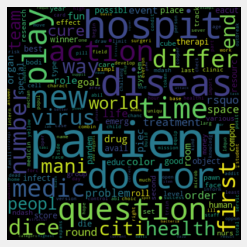

Horror:


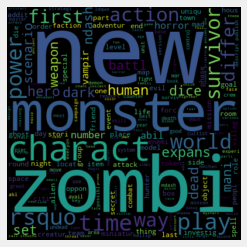

Industry:


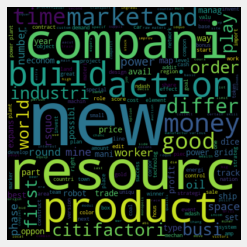

Fan Expansion:


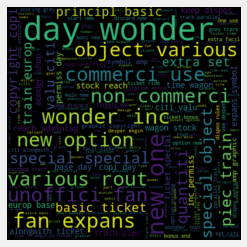

Civil War:


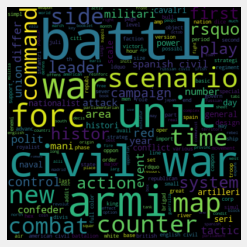

Puzzle:


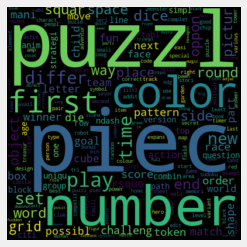

Travel:


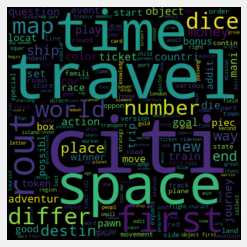

Party Game:


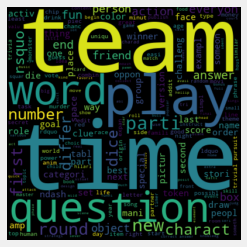

Territory Building:


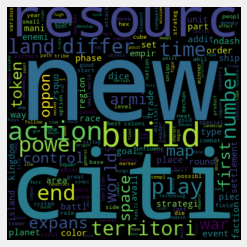

American Revolutionary War:


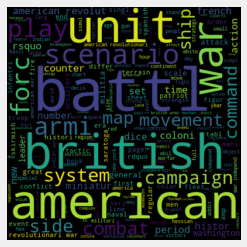

Trivia:


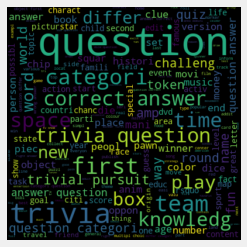

Collectible Components:


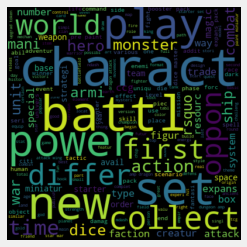

Educational:


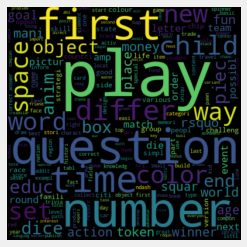

Mature:


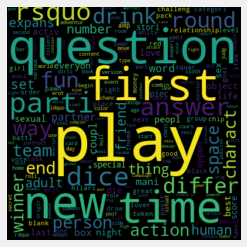

Modern Warfare:


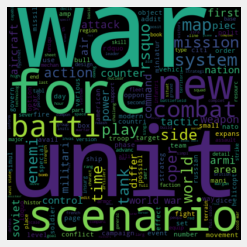

Political:


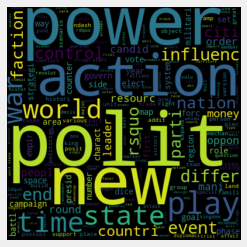

Expansion for Base-game:


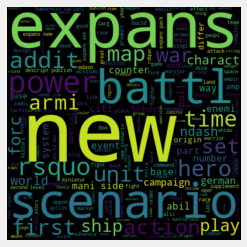

Religious:


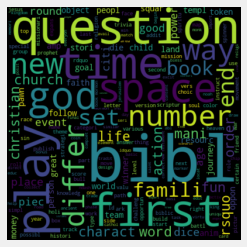

Mafia:


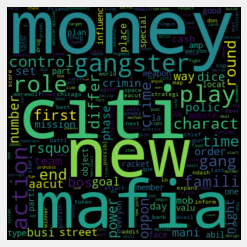

American Indian Wars:


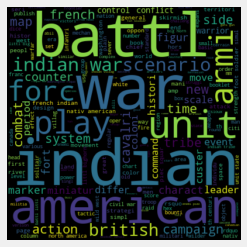

Comic Book:


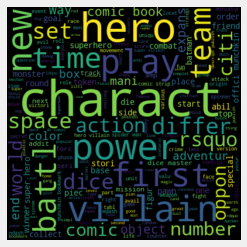

Number:


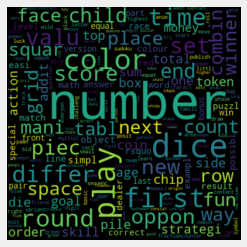

Movies:


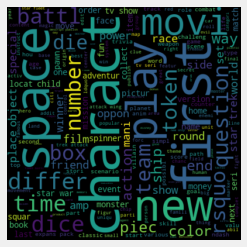

Negotiation:


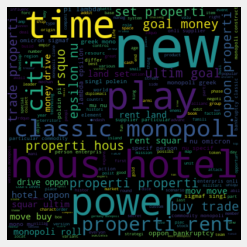

Korean War:


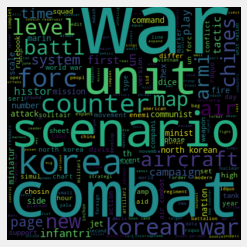

Pirates:


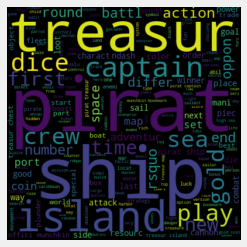

Radio theme:


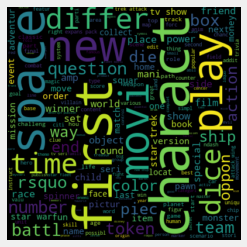

Ancient:


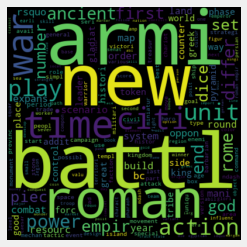

Novel-based:


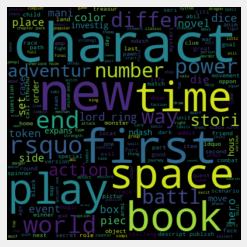

Space Exploration:


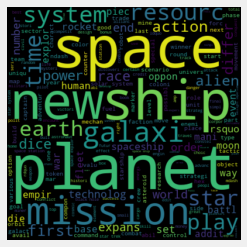

Exploration:


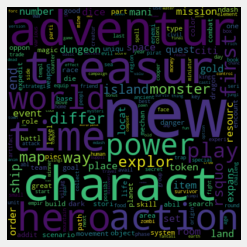

Book:


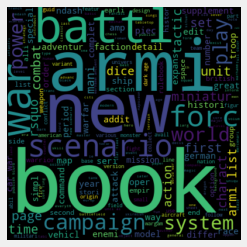

World War II:


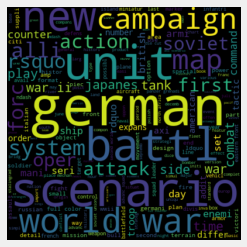

Science Fiction:


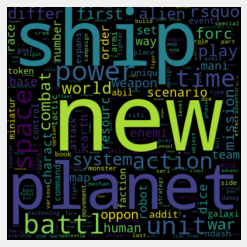

Fantasy:


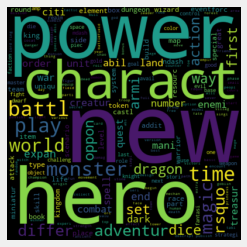

Miniatures:


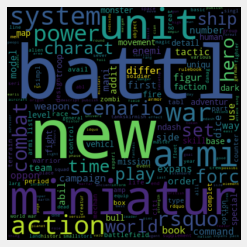

Medieval:


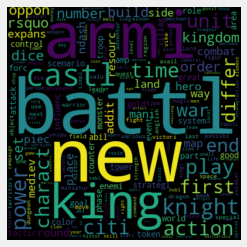

Memory:


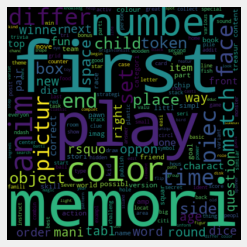

Strip:


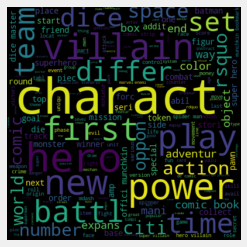

Abstract Strategy:


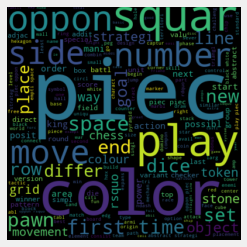

Transportation:


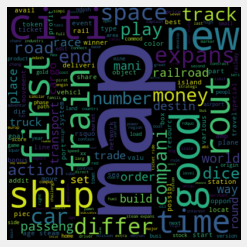

Bluffing:


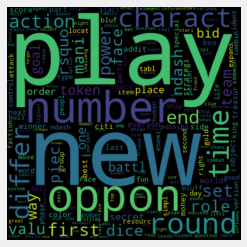

Wargame:


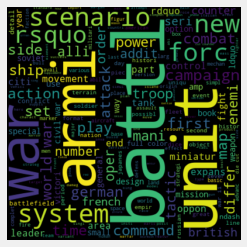

Adventure:


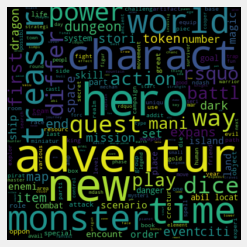

Video Game Theme:


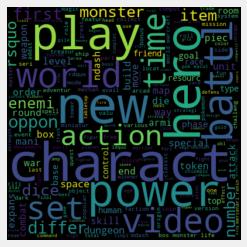

Racing:


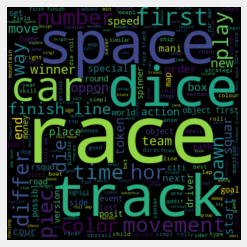

Music:


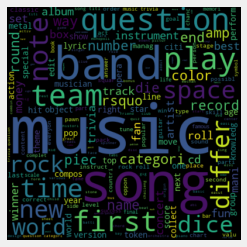

Spies/Secret Agents:


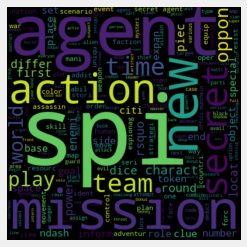

Post-Napoleonic:


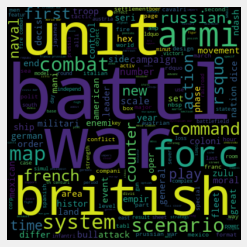

Game System:


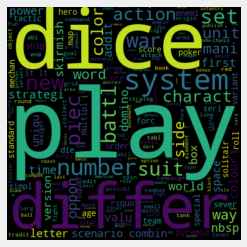

Fighting:


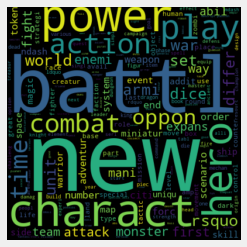

Pike and Shot:


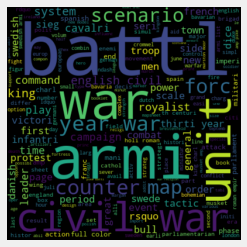

Children's Game:


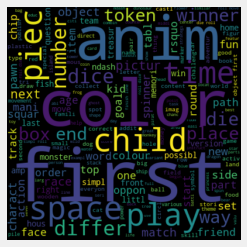

Vietnam War:


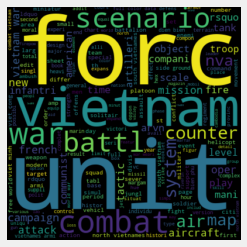

Napoleonic:


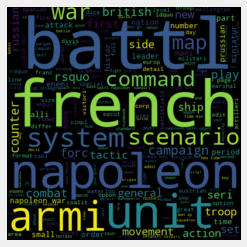

Real-time:


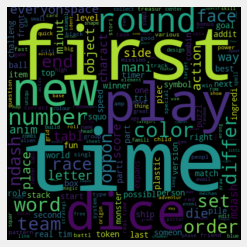

Dexterity:


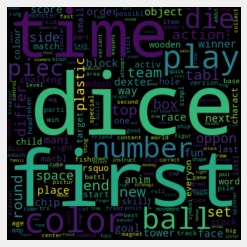

Electronic:


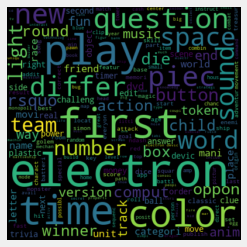

Sports:


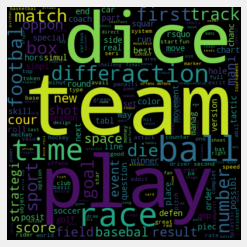

Dice:


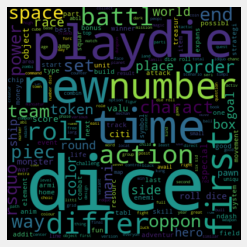

Word Game:


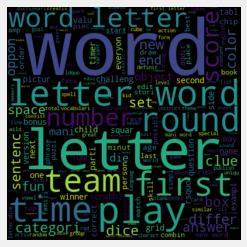

Math:


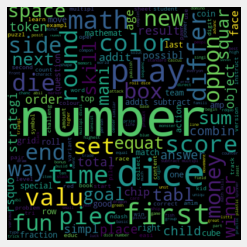

Arabian:


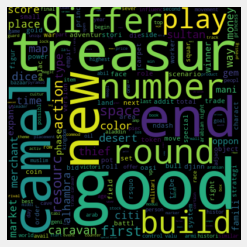

Adult:


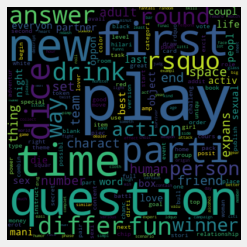

In [541]:
catTokens = []


for i, cat_ in enumerate(CATEGORIES):
    temp_tokens = worddata_clean['tokens'][(categorydf.iloc[:,i])].to_list()
    temp_tokens = (" ").join(temp_tokens)
    if '/' in cat_:
        cat_1 = cat_.replace("/","-")
    else:
        cat_1 = cat_
    wordcloud = WordCloud(width=400, height=400).generate(temp_tokens)
    wordcloud.to_file(f"img/categories/{cat_1}.png")
    # Display the generated image:
    print(f"{cat_}:")
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()

In [316]:
first100word = worddata_clean[0:100]
first100word.head(3)

,game.id,name,description,category,mechanic
0,1,Die Macher,Die Macher is a game about seven sequential po...,"[Economic, Negotiation, Political]","[Area Control, Area Influence, Auction/Bidding..."
1,2,Dragonmaster,Dragonmaster is a trick-taking card game based...,"[Card Game, Fantasy]",[Trick-taking]
2,3,Samurai,"Part of the Knizia tile-laying trilogy, Samura...","[Abstract Strategy, Medieval]","[Area Control, Area Influence, Hand Management..."


In [517]:

def extract_bow_from_raw_text(text_as_string):
    """Extracts bag-of-words from a raw text string.

    Parameters
    ----------
    text (str): a text document given as a string

    Returns
    -------
    list : the list of the tokens extracted and filtered from the text
    """
    if (text_as_string == None):
        return []

    if (len(text_as_string) < 1):
        return []
    numpattern = r'[0-9]'
    text_as_string = re.sub(numpattern, '', text_as_string)
    
    COMMON_WORDS = ["game","point","board","player","rule","turn","tile","card","deck","hand","points","victory","win","lose","defeat","quot"]
    for word in text_as_string.split():
        if word in COMMON_WORDS:
            text_as_string = text_as_string.replace(word, "")
    
# use MDS to examine the visualization
# use the top 10 words to eyeball it and add common words to the `COMMON_WORDS` list run again.
    
#     nfkd_form = unicodedata.normalize('NFKD', text_as_string)
#     text_input = str(nfkd_form.encode('ASCII', 'ignore'))

    sent_tokens = sent_tokenize(text_as_string)

    tokens = list(map(word_tokenize, sent_tokens))

    sent_tags = list(map(pos_tag, tokens))

    grammar = r"""
        SENT: {<(J|N).*>}                # chunk sequences of proper nouns
    """

    cp = RegexpParser(grammar)
    ret_tokens = list()
    stemmer_snowball = SnowballStemmer('english')
    lemmatizer = WordNetLemmatizer()

    for sent in sent_tags:
        tree = cp.parse(sent)
        for subtree in tree.subtrees():
            if subtree.label() == 'SENT':
                t_tokenlist = [tpos[0].lower() for tpos in subtree.leaves()]
                
                t_tokens_lemmatize = list(map(lemmatizer.lemmatize, t_tokenlist))
                t_tokens_stemsnowball = list(map(stemmer_snowball.stem, t_tokens_lemmatize))
                #t_token = "-".join(t_tokens_stemsnowball)
                #ret_tokens.append(t_token)
#                 ret_tokens.extend(t_tokens_lemmatize)
                ret_tokens.extend(t_tokens_stemsnowball)
            #if subtree.label() == 'V2V': print(subtree)
    #tokens_lower = [map(string.lower, sent) for sent in tokens]
    ret = []
    for token in ret_tokens:
        if token in COMMON_WORDS:
            pass
        else:
            ret.append(token)

    return(' '.join(ret))

def print_features(vectorizer, kmeans):
    features = vectorizer.get_feature_names()
    top_centroids = kmeans.cluster_centers_.argsort()[:,-1:-20:-1]
    print("top features (words) for each cluster:")
    
    
    for num, centroid in enumerate(top_centroids):
        print(f"{num}, {', '.join(features[i] for i in centroid)}")
        text = " ".join(features[i] for i in centroid)
        # Create and generate a word cloud image:
        wordcloud = WordCloud(width=400, height=400).generate(text)
        wordcloud.to_file(f"img/{num}.png")
        # Display the generated image:
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")
        plt.show()


In [367]:
# X_snowball = vectorizer.fit_transform(first100word['description'][0:1])
# print("number of features: ",len(vectorizer.get_feature_names()))
# vectorizer.get_feature_names()

In [518]:
vectorizer = TfidfVectorizer(stop_words=sw)

In [402]:
X_snowball = vectorizer.fit_transform(first100word['description'].values.astype('U'))
print("number of features: ",len(vectorizer.get_feature_names()))

number of features:  1849


In [512]:
sw = set(stopwords.words('english'))

In [513]:
new_words = set(["quot","game", "board", "player", "turn","tile","card","deck","hand","points","victory","win","lose","defeat"])
sw.update(new_words)

abil abl abstract accur achiev acquir acquire acr action activ actor actual adb add addit adjac adject admin advanc advancements advantag adventur affect afoot africa age agenda agent agreement agricultur aid aim air aircraft airlin al alan alea alexand ali alien allegi alli allow alten altern amaz ambit amend america american amount amp amphibi ancestor ancient andi anfa angel anniversari anti anubi anyon apc appl approach appropri arabia archaeolog archangel archipelago area arkham arm armada armi armies armor art articl artisan artist artwork arvn ascalion asia asian aspect assault assembl assist assur astonish attack attempt auction auml authent avail avalon avalonhill awar award axi babylonian back background badder bake balanc balkan ball ballet band bank bankrol barbarian barg baron basari base basic battl battle battleboard battles battleship bavarian bazaar bean beauregard beauti became becom begin beginn belt benni ber best better bgg bid bidder big bigger biggest biolog birt

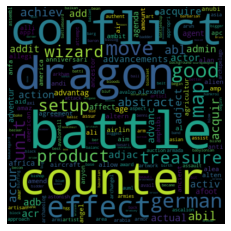

In [374]:
# join list of features to one long string
text = " ".join([word for word in vectorizer.get_feature_names()])

print(text)
# Create and generate a word cloud image:
wordcloud = WordCloud(width=400, height=400).generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

top features (words) for each cluster:
0, robot, bunni, carrot, fox, target, idea, factori, puzzl, movement, wall


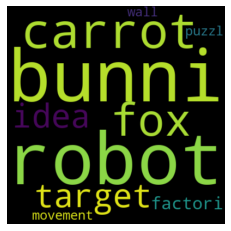

1, empir, conquest, ship, unit, movement, faction, feder, axi, arkham, horror


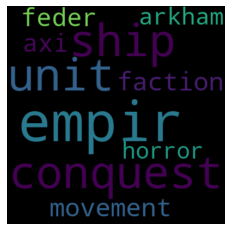

2, edit, dice, resourc, borderland, catan, twilight, set, bean, imperium, bohnanza


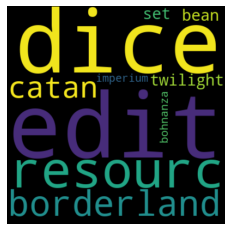

3, region, king, parti, order, ingredi, caballero, thing, land, pizza, actor


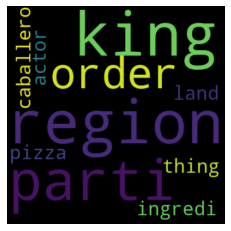

4, busi, stock, column, airlin, compani, chocol, sid, money, sackson, share


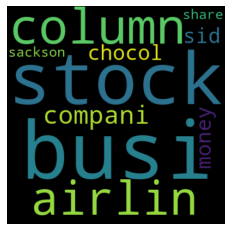

5, charact, treasur, illuminati, fossil, monster, magic, dice, templ, titan, tower


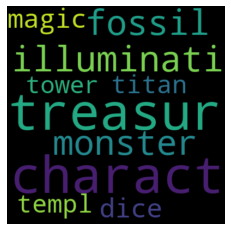

6, block, unit, war, strength, detail, side, map, columbia, step, way


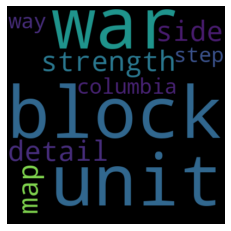

7, build, stori, citi, site, natur, town, duchi, plot, contract, cathedr


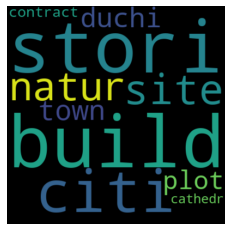

8, civil, war, follow, peopl, payout, leader, advanc, event, middl, ziggurat


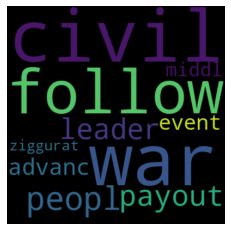

9, action, knight, abstract, wall, creat, natur, torr, disk, placement, gem


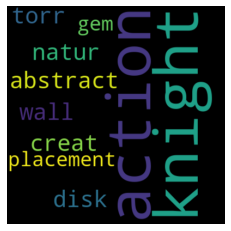

10, quot, hedgehog, expedit, samurai, row, move, shogun, easi, bollox, sandwich


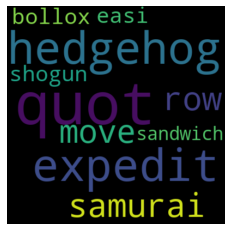

11, round, quot, transport, shop, auction, descript, duel, commod, activ, knizia


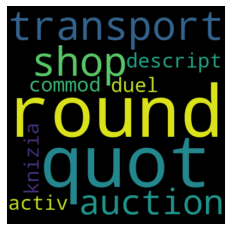

12, metal, garden, full, te, scienc, plan, plant, child, spinner, educ


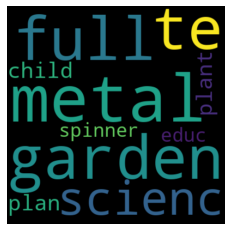

13, trick, suit, winner, tak, extra, unusu, dealer, genr, twist, polit


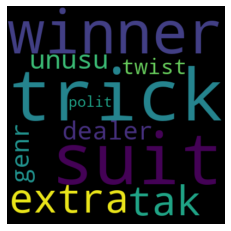

14, object, station, happi, table, train, explor, first, cash, trip, fund


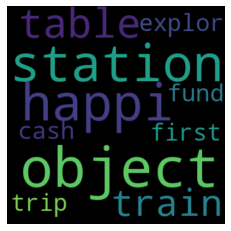

In [403]:
maxk = 15
wcss = np.zeros(maxk)
kmeans = KMeans(maxk)
kmeans.fit(X_snowball)
print_features(vectorizer, kmeans)

In [404]:
extract_bow_from_raw_text(first100word['description'][0])

'die macher sequenti polit race differ region germani charg nation polit parti limit resourc parti victori parti victori region elect differ way victori region elect victori size region parti second parti region elect medium influenc region parti media-control victori third parti nation parti membership fair number victori parti victori parti platform nation opinion end game. edit parti old west germani edit re-unit germani sever featur edit shorter round variant addit updat origin designer. die macher valley classic line'

In [507]:
# preprocess dataframe with extract_bow_from_raw_text

first100word['tokens'] = first100word['description'].apply(lambda x: extract_bow_from_raw_text(x))

In [413]:
first100word.head()

,game.id,name,description,category,mechanic,tokens
0,1,Die Macher,Die Macher is a game about seven sequential po...,"[Economic, Negotiation, Political]","[Area Control, Area Influence, Auction/Bidding...",die macher sequenti polit race differ region g...
1,2,Dragonmaster,Dragonmaster is a trick-taking card game based...,"[Card Game, Fantasy]",[Trick-taking],dragonmast trick-tak older coup d'etat suppli ...
2,3,Samurai,"Part of the Knizia tile-laying trilogy, Samura...","[Abstract Strategy, Medieval]","[Area Control, Area Influence, Hand Management...",part knizia tile-lay trilog samurai mediev jap...
3,4,Tal der Könige,When you see the triangular box and the luxuri...,[Ancient],"[Action Point Allowance System, Area Control, ...",triangular box luxuri larg block beauti functi...
4,11,Bohnanza,Bohnanza is the first in the Bohnanza family o...,"[Card Game, Farming, Negotiation]","[Hand Management, Set Collection, Trading]",bohnanza first bohnanza famili sever differ ed...


In [416]:
categories = get_unique(first100word[['category']])
categories

set()

In [381]:
X_snowball

#sparse matrix helps store large matrices with a lot of zeroes

<100x1849 sparse matrix of type '<class 'numpy.float64'>'
	with 4495 stored elements in Compressed Sparse Row format>

In [265]:
from scipy.sparse.linalg import svds

mat = X_snowball
names = first100words['name']

# Compute SVD
U, sigma, VT = svds(mat)

k = 5
topics = ['latent_topic_{}'.format(i) for i in range(k)]

# Keep top k concepts for comparison
U = U[:,:k]
sigma = sigma[:k]
VT = VT[:k,:]

# Make pretty
U, sigma, VT = (np.around(x,2) for x in (U,sigma,VT))
U = pd.DataFrame(U, index = names)
VT_df = pd.DataFrame(VT, index = topics)

print('\nMatrix U: ')
print(U)
print('\nMatrix S: ')
print(sigma)
print('\nMatrix V: ')
print(VT)


Matrix U: 
                                 0     1     2     3     4
name                                                      
Die Macher                   -0.04 -0.03  0.06  0.03 -0.14
Dragonmaster                  0.02 -0.03 -0.09 -0.37 -0.17
Samurai                      -0.02  0.16 -0.09  0.00 -0.11
Tal der Könige                0.12  0.04  0.04 -0.04  0.01
Bohnanza                     -0.05 -0.04  0.07  0.03 -0.09
...                            ...   ...   ...   ...   ...
Detroit-Cleveland Grand Prix -0.21 -0.03  0.11  0.00 -0.08
Klunker                      -0.04  0.02  0.05  0.00 -0.06
Titan                        -0.00 -0.12 -0.03  0.05 -0.09
Extrablatt                    0.01 -0.01 -0.03  0.01 -0.06
Rheinländer                   0.13  0.07  0.21  0.03 -0.10

[100 rows x 5 columns]

Matrix S: 
[1.26 1.3  1.32 1.39 1.75]

Matrix V: 
[[ 0.04 -0.03 -0.01 ...  0.   -0.    0.05]
 [-0.04 -0.    0.01 ...  0.01  0.02  0.01]
 [-0.04  0.01  0.03 ... -0.01 -0.01 -0.03]
 [ 0.04  0.    0.

In [223]:
VT_df

,0,1,2,3,4,5,6,7,8,9,...,1824,1825,1826,1827,1828,1829,1830,1831,1832,1833
latent_topic_0,0.03,-0.02,-0.03,0.00,0.00,-0.04,-0.03,0.01,-0.19,0.00,...,-0.0,-0.01,-0.00,0.01,-0.0,-0.00,-0.01,0.01,-0.00,0.04
latent_topic_1,0.02,0.00,0.01,0.00,0.01,-0.00,-0.01,-0.00,0.08,-0.05,...,-0.0,0.01,-0.01,0.00,0.0,0.01,0.01,-0.00,-0.02,-0.02
latent_topic_2,-0.04,0.01,0.04,-0.01,-0.00,0.02,0.01,0.01,0.11,-0.04,...,0.0,-0.00,0.02,-0.00,-0.0,-0.01,-0.00,-0.00,-0.01,-0.02
latent_topic_3,0.05,0.00,-0.03,0.01,0.01,-0.04,-0.01,0.00,-0.01,-0.00,...,0.0,-0.00,-0.00,0.01,0.0,0.01,-0.00,-0.01,-0.01,0.03
latent_topic_4,0.04,0.03,0.03,0.01,0.00,0.02,0.01,0.00,0.13,0.04,...,0.0,0.00,0.03,0.01,0.0,0.01,0.00,0.01,0.01,0.05


In [157]:
from sklearn.manifold import MDS
from statsmodels.iolib.foreign import genfromdta
from scipy.spatial import distance

In [266]:
print(names)
games_numpy = VT_df.iloc[:4].to_numpy().T
games_numpy

0                        Die Macher
1                      Dragonmaster
2                           Samurai
3                    Tal der Könige
4                          Bohnanza
                   ...             
107    Detroit-Cleveland Grand Prix
108                         Klunker
109                           Titan
110                      Extrablatt
111                     Rheinländer
Name: name, Length: 100, dtype: object


array([[ 0.04, -0.04, -0.04,  0.04],
       [-0.03, -0.  ,  0.01,  0.  ],
       [-0.01,  0.01,  0.03,  0.  ],
       ...,
       [ 0.  ,  0.01, -0.01, -0.01],
       [-0.  ,  0.02, -0.01, -0.01],
       [ 0.05,  0.01, -0.03,  0.03]])

In [267]:
dist = distance.pdist(games_numpy, metric = "chebyshev")
distance.squareform(dist)

array([[0.  , 0.07, 0.07, ..., 0.05, 0.06, 0.05],
       [0.07, 0.  , 0.02, ..., 0.03, 0.03, 0.08],
       [0.07, 0.02, 0.  , ..., 0.04, 0.04, 0.06],
       ...,
       [0.05, 0.03, 0.04, ..., 0.  , 0.01, 0.05],
       [0.06, 0.03, 0.04, ..., 0.01, 0.  , 0.05],
       [0.05, 0.08, 0.06, ..., 0.05, 0.05, 0.  ]])

In [268]:
mds = MDS(dissimilarity='precomputed').fit_transform(distance.squareform(dist))

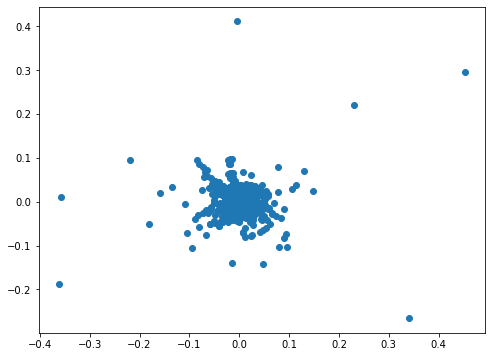

In [269]:
plt.figure(figsize=(8,6))
plt.plot(mds[:, 0], mds[:, 1], 'o', alpha = 1);
# plt.xlim([-0.1,0.1])
# for movie, pos in zip(names, mds):
#     plt.annotate(movie, (pos[0], pos[1]),
#                      alpha = 1)

'abil abl abstract accur achiev acquir acquire acr action activ actor actual adb add addit adjac adject admin advanc advancements advantag adventur affect afoot africa age agenda agent agreement agricultur aid aim air aircraft airlin al alan alea alexand ali alien allegi alli allow alten altern amaz ambit amend america american amp amphibi ancestor ancient andi anfa angel anniversari anti anubi anyon apc appl approach appropri arabia archaeolog archangel archipelago area arkham arm armada armi armies armor art articl artisan artist artwork arvn ascalion asia asian aspect assault assembl assist assur astonish attack attempt auction auml authent avail avalon avalonhill awar award axi babylonian background badder bake balanc balkan ball ballet band bank barbarian barg baron basari base basic battl battle battles battleship bavarian bazaar bean beauregard beauti becom begin beginn belt benni ber best better bgg bid bidder big bigger biggest biolog birth bishop bit black blind block blockse

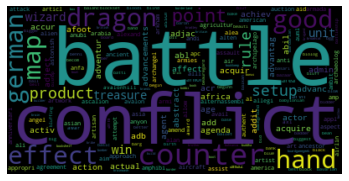